<a href="https://colab.research.google.com/github/eulerianKnight/ExplainableAI/blob/main/Intel_Image_Classification_XAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Package to download kaggle datasets
!pip install opendatasets jupyterthemes --upgrade --quiet

     |████████████████████████████████| 7.0 MB 3.4 MB/s 
     |████████████████████████████████| 9.9 MB 53.7 MB/s 
     |████████████████████████████████| 46 kB 3.9 MB/s 
     |████████████████████████████████| 1.6 MB 54.3 MB/s 
     |████████████████████████████████| 49 kB 6.0 MB/s 
     |████████████████████████████████| 423 kB 54.7 MB/s 
     |████████████████████████████████| 59 kB 7.0 MB/s 
     |████████████████████████████████| 86 kB 5.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires notebook~=5.3.0, but you have notebook 6.4.12 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0, but you have tornado 6.2 which is incompatible.


In [3]:
# Download the dataset
import opendatasets as od
dataset_url = "https://www.kaggle.com/puneet6060/intel-image-classification"
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: eulerianknight
Your Kaggle Key: ··········


100%|██████████| 346M/346M [00:08<00:00, 43.7MB/s]


In [19]:
# import the necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

import os
from IPython.display import display
import PIL
from jupyterthemes import jtplot
jtplot.style(theme='monokai', 
             context='notebook', 
             ticks=True, 
             grid=False)

In [8]:
TRAIN_DIR = '/content/intel-image-classification/seg_train/seg_train'
TEST_DIR = '/content/intel-image-classification/seg_test/seg_test'
print(os.listdir(TRAIN_DIR))
print(os.listdir(TEST_DIR))

['mountain', 'glacier', 'street', 'sea', 'forest', 'buildings']
['mountain', 'glacier', 'street', 'sea', 'forest', 'buildings']


## Data Exploration and Visualization

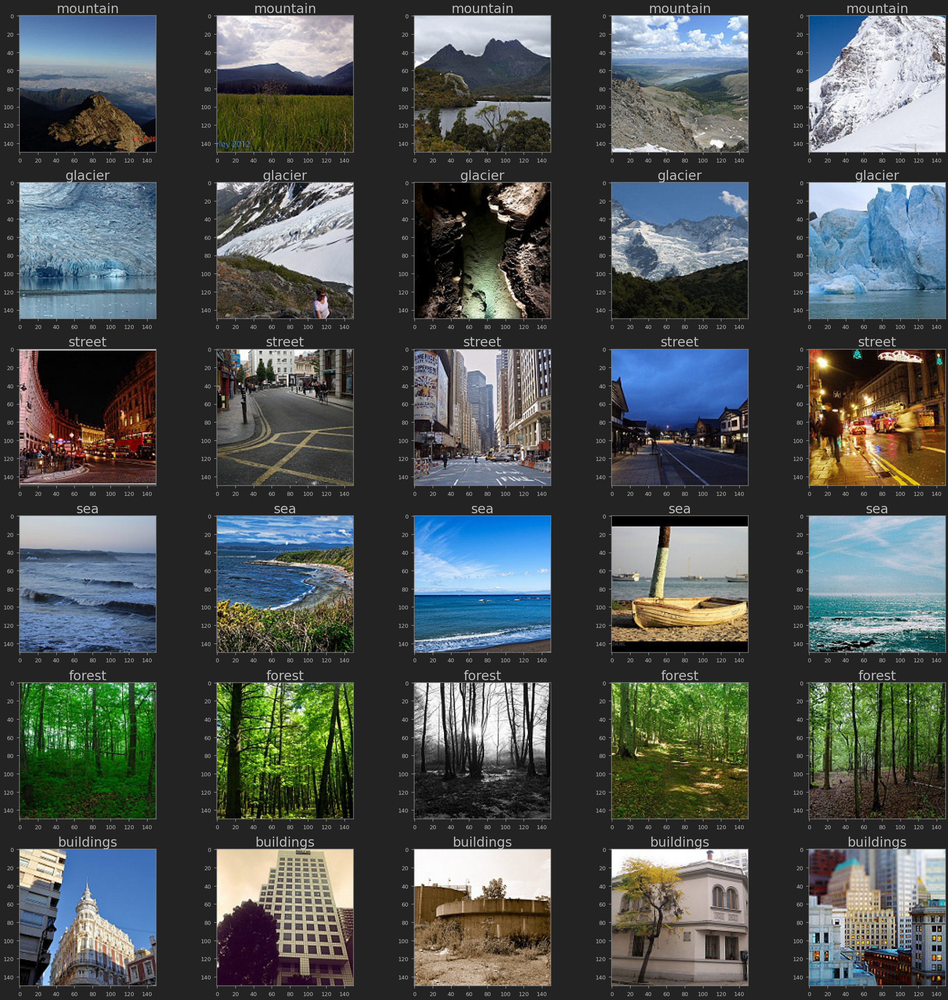

In [9]:
fig, axes = plt.subplots(6, 5, figsize=(32, 32))
count = 0
for i in os.listdir(TRAIN_DIR):
  train_class = os.listdir(os.path.join(TRAIN_DIR, i))
  for j in range(5):
    img = os.path.join(TRAIN_DIR, i, train_class[j])
    img = PIL.Image.open(img)
    axes[count][j].imshow(img)
    axes[count][j].set_title(i, fontsize=30)
  count += 1
fig.tight_layout()

In [10]:
no_of_images_per_class = []
class_name = []
for i in os.listdir(TRAIN_DIR):
  train_class = os.listdir(os.path.join(TRAIN_DIR, i))
  no_of_images_per_class.append(len(train_class))
  class_name.append(i)
  print(f'Number of images in {i} is: {len(train_class)}')

Number of images in mountain is: 2512
Number of images in glacier is: 2404
Number of images in street is: 2382
Number of images in sea is: 2274
Number of images in forest is: 2271
Number of images in buildings is: 2191


In [11]:
no_of_images_per_class

[2512, 2404, 2382, 2274, 2271, 2191]

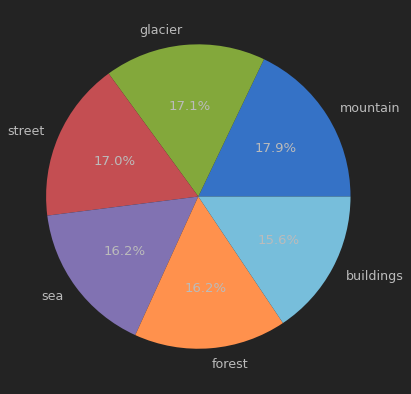

In [12]:
fig1, axes1 = plt.subplots()
axes1.pie(no_of_images_per_class, labels=class_name, autopct = '%1.1f%%')
plt.show()

## Data Augmentation and Data Generator

In [13]:
# Train DataGenerator
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        validation_split=0.15,
        horizontal_flip=True)

# Test DataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

In [14]:
train_generator = train_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset ='training')

validation_generator = train_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical',
        subset ='validation')

test_generator = test_datagen.flow_from_directory(
        TEST_DIR,
        target_size=(256, 256),
        batch_size=32,
        class_mode='categorical')

Found 11932 images belonging to 6 classes.
Found 2102 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


## Build ResNET

In [15]:
def res_block(X, filter, stage):
  
  # Convolutional_block
  X_copy = X

  f1 , f2, f3 = filter
    
  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_conv_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = MaxPool2D((2,2))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_conv_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_c')(X)


  # Short path
  X_copy = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_conv_copy', kernel_initializer= glorot_uniform(seed = 0))(X_copy)
  X_copy = MaxPool2D((2,2))(X_copy)
  X_copy = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_conv_copy')(X_copy)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  # Identity Block 1
  X_copy = X


  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_1_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_1_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_1_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_1_c')(X)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  # Identity Block 2
  X_copy = X


  # Main Path
  X = Conv2D(f1, (1,1),strides = (1,1), name ='res_'+str(stage)+'_identity_2_a', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_a')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f2, kernel_size = (3,3), strides =(1,1), padding = 'same', name ='res_'+str(stage)+'_identity_2_b', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_b')(X)
  X = Activation('relu')(X) 

  X = Conv2D(f3, kernel_size = (1,1), strides =(1,1),name ='res_'+str(stage)+'_identity_2_c', kernel_initializer= glorot_uniform(seed = 0))(X)
  X = BatchNormalization(axis =3, name = 'bn_'+str(stage)+'_identity_2_c')(X)

  # ADD
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [16]:
# input shape
input_shape = (256,256,3)

# input tensor shape
X_input = Input(input_shape)

# zero-padding
X = ZeroPadding2D((3,3))(X_input)

# 1 - stage
X = Conv2D(64, (7,7), strides= (2,2), name = 'conv1', kernel_initializer= glorot_uniform(seed = 0))(X)
X = BatchNormalization(axis =3, name = 'bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3,3), strides= (2,2))(X)

# 2- stage
X = res_block(X, filter= [64,64,256], stage= 2)

# 3- stage
X = res_block(X, filter= [128,128,512], stage= 3)

# 4- stage
X = res_block(X, filter= [256,256,1024], stage= 4)

# 5- stage
X = res_block(X, filter= [512,512,2048], stage= 5)

# average Pooling
X = AveragePooling2D((2,2), name = 'Averagea_Pooling')(X)

# final layer
X = Flatten()(X)
X = Dense(6, activation = 'softmax', name = 'Dense_final', kernel_initializer= glorot_uniform(seed=0))(X)

# create model
model = Model( inputs= X_input, outputs = X, name = 'Resnet18')

# model summary
model.summary()


Model: "Resnet18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 128, 128, 64  9472        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                           

## Compile and Train the Model

In [17]:
# Early Stopping
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)

# Model Checkpoint
checkpointer = ModelCheckpoint(filepath="weights.hdf5", verbose=1, save_best_only=True)

In [18]:
# Compile
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics= ['accuracy'])
# Fit the model
history = model.fit_generator(train_generator, 
                              steps_per_epoch=train_generator.n // 32, 
                              epochs=5, 
                              validation_data=validation_generator, 
                              validation_steps=validation_generator.n // 32, 
                              callbacks=[checkpointer , earlystopping])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  if __name__ == '__main__':


Epoch 1/5
372/372 [==============================] - ETA: 0s - loss: 1.1548 - accuracy: 0.6080
Epoch 1: val_loss improved from inf to 1.42272, saving model to weights.hdf5
372/372 [==============================] - 200s 487ms/step - loss: 1.1548 - accuracy: 0.6080 - val_loss: 1.4227 - val_accuracy: 0.4832
Epoch 2/5
372/372 [==============================] - ETA: 0s - loss: 0.6884 - accuracy: 0.7522
Epoch 2: val_loss improved from 1.42272 to 1.42081, saving model to weights.hdf5
372/372 [==============================] - 183s 490ms/step - loss: 0.6884 - accuracy: 0.7522 - val_loss: 1.4208 - val_accuracy: 0.5635
Epoch 3/5
372/372 [==============================] - ETA: 0s - loss: 0.6006 - accuracy: 0.7850
Epoch 3: val_loss improved from 1.42081 to 1.28913, saving model to weights.hdf5
372/372 [==============================] - 184s 493ms/step - loss: 0.6006 - accuracy: 0.7850 - val_loss: 1.2891 - val_accuracy: 0.5399
Epoch 4/5
372/372 [==============================] - ETA: 0s - loss: 0.

## Evaluate Model

In [20]:
# Evaluate the performance of the model
print('Train loss & accuracy:', model.evaluate(train_generator))
print('\n')
print('Test loss & accuracy:', model.evaluate(test_generator))

373/373 [==============================] - 150s 402ms/step - loss: 0.9635 - accuracy: 0.6377
Train loss & accuracy: [0.9634732007980347, 0.6376969218254089]


94/94 [==============================] - 6s 65ms/step - loss: 1.0810 - accuracy: 0.6053
Test loss & accuracy: [1.0809824466705322, 0.6053333282470703]


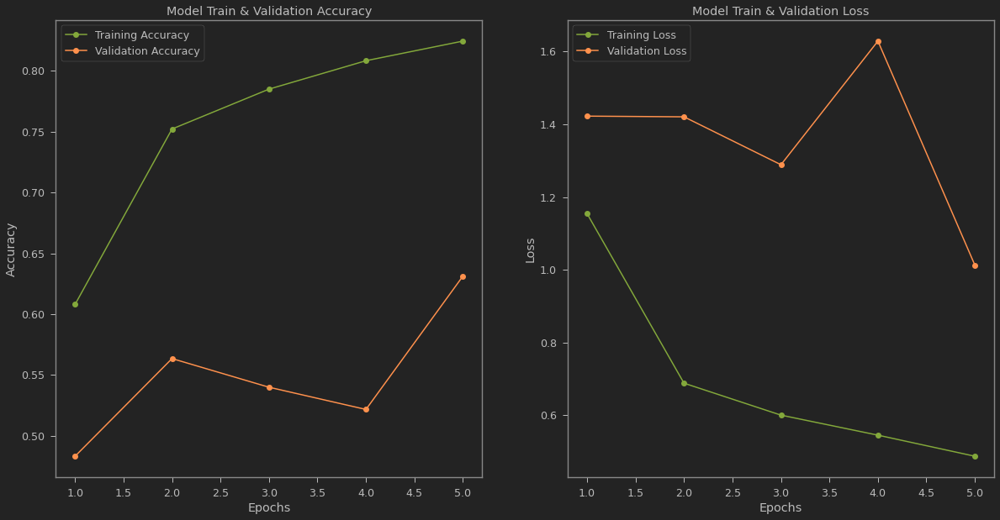

In [21]:
# Plot
fig , ax = plt.subplots(1, 2)
fig.set_size_inches(20, 10)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs, train_acc , 'go-' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'yo-' , label = 'Validation Accuracy')
ax[0].set_title('Model Train & Validation Accuracy')
ax[0].legend()
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')

ax[1].plot(epochs, train_loss , 'go-' , label = 'Training Loss')
ax[1].plot(epochs, val_loss , 'yo-' , label = 'Validation Loss')
ax[1].set_title('Model Train & Validation Loss')
ax[1].legend()
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')

plt.show()

In [22]:
labels = {0: 'buildings', 1: 'forest', 2: 'glacier', 3:'mountain', 4: 'sea', 5:'street'}

In [23]:
prediction = []
original = []
image = []
count = 0
for i in os.listdir(TEST_DIR):
  for item in os.listdir(os.path.join(TEST_DIR, i)):
    # code to open the image
    img= PIL.Image.open(os.path.join(TEST_DIR, i, item))
    # resizing the image to (256,256)
    img = img.resize((256, 256))
    # appending image to the image list
    image.append(img)
    # converting image to array
    img = np.asarray(img, dtype = np.float32)
    # normalizing the image
    img = img / 255
    # reshaping the image into a 4D array
    img = img.reshape(-1, 256, 256, 3)
    # making prediction of the model
    predict = model.predict(img)
    # getting the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    # appending the predicted class to the list
    prediction.append(labels[predict])
    # appending original class to the list
    original.append(i)

In [24]:
# Test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.6593333333333333


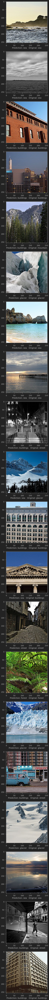

In [25]:
# Visualize the results
import random
fig = plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0, len(image))
    fig.add_subplot(20, 1, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [26]:
# Classifcation report
print(classification_report(np.asarray(prediction), np.asarray(original)))

              precision    recall  f1-score   support

   buildings       0.96      0.44      0.60       967
      forest       0.62      0.97      0.76       304
     glacier       0.64      0.86      0.73       409
    mountain       0.49      0.88      0.63       290
         sea       0.91      0.59      0.71       786
      street       0.39      0.79      0.52       244

    accuracy                           0.66      3000
   macro avg       0.67      0.75      0.66      3000
weighted avg       0.78      0.66      0.66      3000



Text(0.5, 1.0, 'Confusion_matrix')

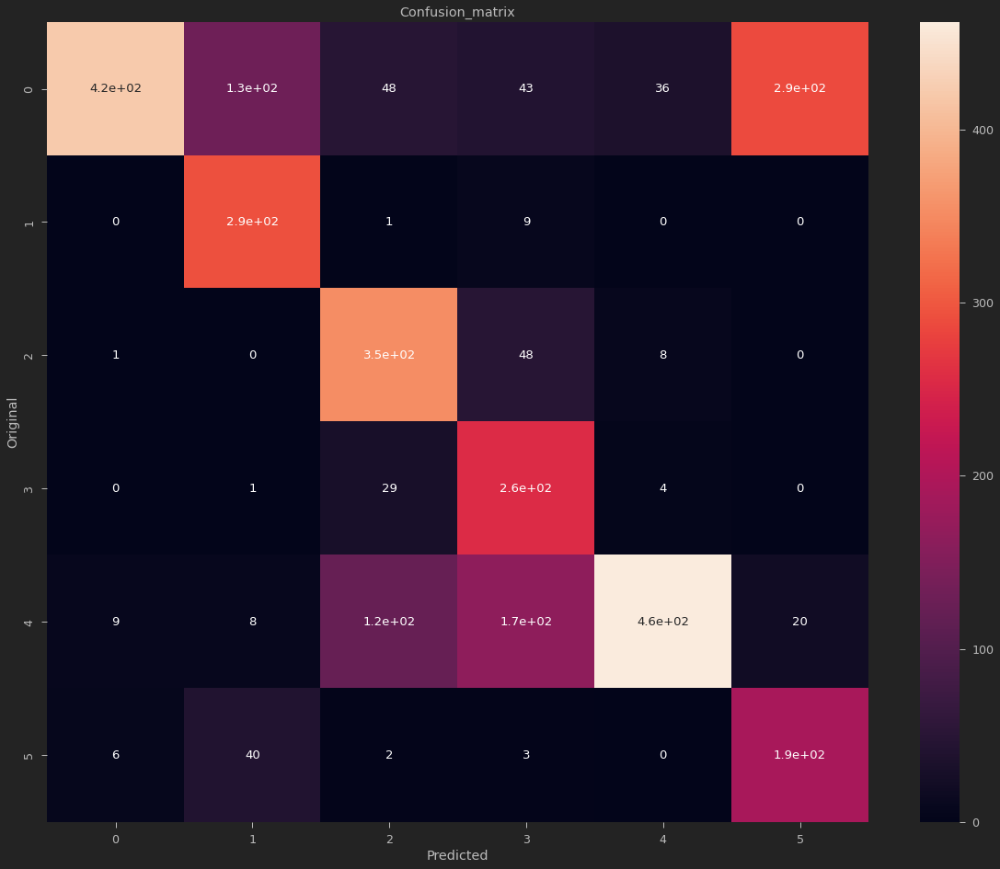

In [27]:
# Confusion matrix
plt.figure(figsize=(20, 16))
cm = confusion_matrix(np.asarray(prediction), np.asarray(original))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax)

ax.set_xlabel('Predicted')
ax.set_ylabel('Original')
ax.set_title('Confusion_matrix')

## GradCAM

In [28]:
def grad_cam(img):

  # convert the image to array of type float32
  img = np.asarray(img, dtype = np.float32)

  # reshape the image from (256,256,3) to (1,256,256,3)
  img = img.reshape(-1, 256, 256, 3)
  img_scaled = img / 255

  # name of the average pooling layer and dense final
  classification_layers = ["Averagea_Pooling", "Dense_final"]

  # last convolutional layer in the model
  final_conv = model.get_layer("res_5_identity_2_c")

  # create a model with original model inputs and the last conv_layer as the output
  final_conv_model = keras.Model(model.inputs, final_conv.output)

  # then we create the input for classification layer, which is the output of last conv layer
  # in our case, output produced by the conv layer is of the shape (1,3,3,2048) 
  # since the classification input needs the features as input, we ignore the batch dimension

  classification_input = keras.Input(shape = final_conv.output.shape[1:])

  # we iterate through the classification layers, to get the final layer and then append 
  # the layer as the output layer to the classification model.
  temp = classification_input
  for layer in classification_layers:
      temp = model.get_layer(layer)(temp)
  classification_model = keras.Model(classification_input, temp)


  # we use gradient tape to monitor the 'final_conv_output' to retrive the gradients
  # corresponding to the predicted class
  with tf.GradientTape() as tape:
      # Pass the image through the base model and get the feature map 
      final_conv_output = final_conv_model(img_scaled)

      # Assign gradient tape to monitor the conv_output
      tape.watch(final_conv_output)
      
      # pass the feature map through the classification model and use argmax to get the 
      # index of the predicted class and then use the index to get the value produced by final
      # layer for that class
      prediction = classification_model(final_conv_output)

      predicted_class = tf.argmax(prediction[0][0][0])

      predicted_class_value = prediction[:,:,:,predicted_class]
  
  # get the gradient corresponding to the predicted class based on feature map.
  # which is of shape (1,3,3,2048)
  gradient = tape.gradient(predicted_class_value, final_conv_output)

  # since we need the filter values (2048), we reduce the other dimensions, 
  # which would result in a shape of (2048,)
  gradient_channels = tf.reduce_mean(gradient, axis=(0, 1, 2))

  # we then convert the feature map produced by last conv layer(1,6,6,1536) to (6,6,1536)
  final_conv_output = final_conv_output.numpy()[0]

  gradient_channels = gradient_channels.numpy()

  # we multiply the filters in the feature map produced by final conv layer by the 
  # filter values that are used to get the predicted class. By doing this we inrease the
  # value of areas that helped in making the prediction and lower the vlaue of areas, that 
  # did not contribute towards the final prediction
  for i in range(gradient_channels.shape[-1]):
      final_conv_output[:, :, i] *= gradient_channels[i]

  # we take the mean accross the channels to get the feature map
  heatmap = np.mean(final_conv_output, axis=-1)

  # normalizing the heat map between 0 and 1, to visualize it
  heatmap_normalized = np.maximum(heatmap, 0) / np.max(heatmap)

  # rescaling and converting the type to int
  heatmap = np.uint8(255 * heatmap_normalized )

  # create the colormap
  color_map = plt.cm.get_cmap('jet')

  # get only the rb features from the heatmap
  color_map = color_map(np.arange(256))[:, :3]
  heatmap = color_map[heatmap]

  # convert the array to image, resize the image and then convert to array
  heatmap = keras.preprocessing.image.array_to_img(heatmap)
  heatmap = heatmap.resize((256, 256))
  heatmap = np.asarray(heatmap, dtype = np.float32)

  # add the heatmap on top of the original image
  final_img = heatmap * 0.4 + img[0]
  final_img = keras.preprocessing.image.array_to_img(final_img)

  return final_img, heatmap_normalized

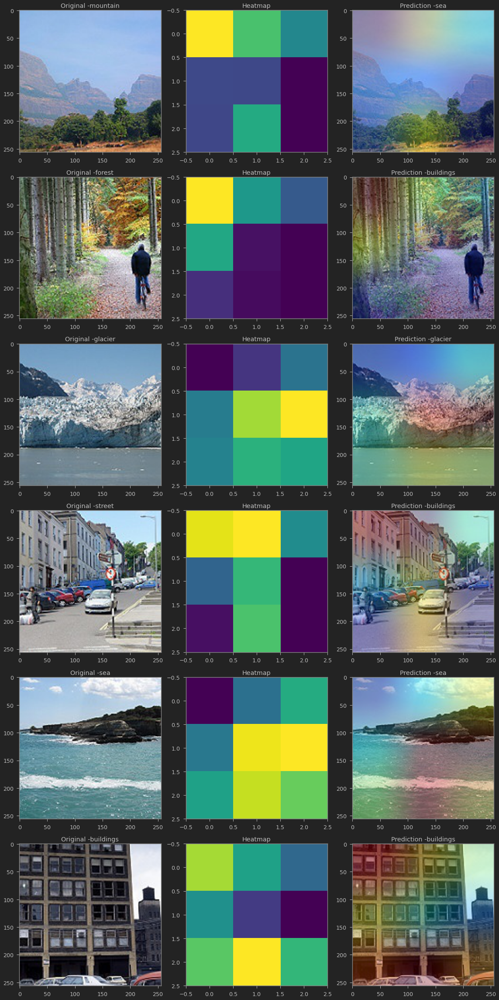

In [29]:
# Visualize the images in the dataset
import random
fig, axs = plt.subplots(6,3, figsize = (16,32))
count = 0
for _ in range(6):
  i = random.randint(0, len(image))
  gradcam, heatmap = grad_cam(image[i])
  axs[count][0].title.set_text("Original -" + original[i])
  axs[count][0].imshow(image[i])
  axs[count][1].title.set_text("Heatmap") 
  axs[count][1].imshow(heatmap)
  axs[count][2].title.set_text("Prediction -" + prediction[i]) 
  axs[count][2].imshow(gradcam)  
  count += 1

fig.tight_layout()